Imagine a world where time-sensitive medical diagnostic conclusions occur in a matter of seconds due to an increase in disease detectability.  A world where diseases can be treated before conditions would have otherwise worsened due to a lack of detectability<br>
<br>
Artificial Intelligence is a means to improve the medical diagnostic process.<br>
<br>
<br>The following is a breast cancer machine learning diagnostic classification project.  This project will encompass the deployment of machine learning on a data set that has historical breast cancer diagnostic information.  The goal is to train the machine learning algorithm to read diagnostic measurements and predict the presence of malignant or benign cells in breast tissue.<br>  
<br>
**Malignant tissue will be represented as a 1.  Benign tissue will be represented as a 0.**<br>
<br>
The data set was distributed by UCI Machine Learning Repository.  The data is credited to its creators Dr. William H. Wolberg, W. Nick Street, and Olvi L. Mangasarian of the University of Wisconsin.

### Bottom Line Up Front:
With scaled data, a machine learning Logistic Regression algorithm was trained to predict the presence of malignant or benign cells in breast tissue with an accuracy of 98%.  A SVC was hypertuned to produce the same results as the Logistic Regression Model.

### Below is a confusion matrix
Top row from left to right: true positive and false negative.<br>
Bottom row from left to right: false positive and true negative.<br>
The left side is the true conditions where 0 = benign and 1 = malignant.<br>
The bottom side is the predicted conditions where 0 = benign and 1 = malignant.<br>
Out of 62 predictions of benign, there was only one misclassification.<br>
Out of 126 predictions of malignant, there was only three misclassifications.<br>
<br>
4 out of 188 predictions were incorrectly classified.  We are asking a lot from these algorithms and in some cases, lives will depend on them.  Not every situation can be modeled with 100% certainty, however, artificial intelligence is paving the way to save lives.<br>
<br>
**Very Respectfully,
Brandon Johnson**


 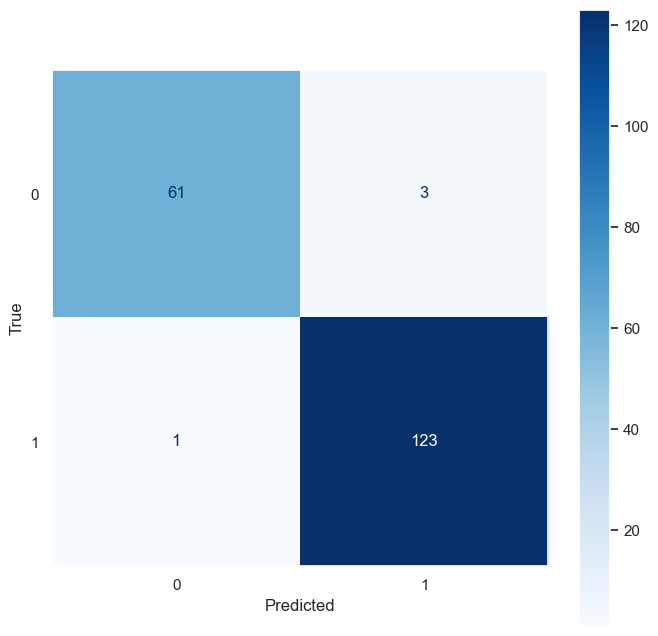

# Getting the data ready

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
from sklearn.datasets import load_breast_cancer

In [3]:
d = load_breast_cancer()

In [4]:
# print(d['DESCR'])

In [5]:
d.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [6]:
df = pd.DataFrame(d['data'], columns=d['feature_names'])

In [7]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [8]:
print(d['target_names'])

['malignant' 'benign']


In [9]:
# print(d['target'])

In [10]:
df1 = pd.DataFrame(d['target'], columns=['tgt'])
df1.head()

,tgt
0,0
1,0
2,0
3,0
4,0


# EDA

In [11]:
df3 = df.copy()
df3 = df3.join(df1)
df3.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,tgt
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


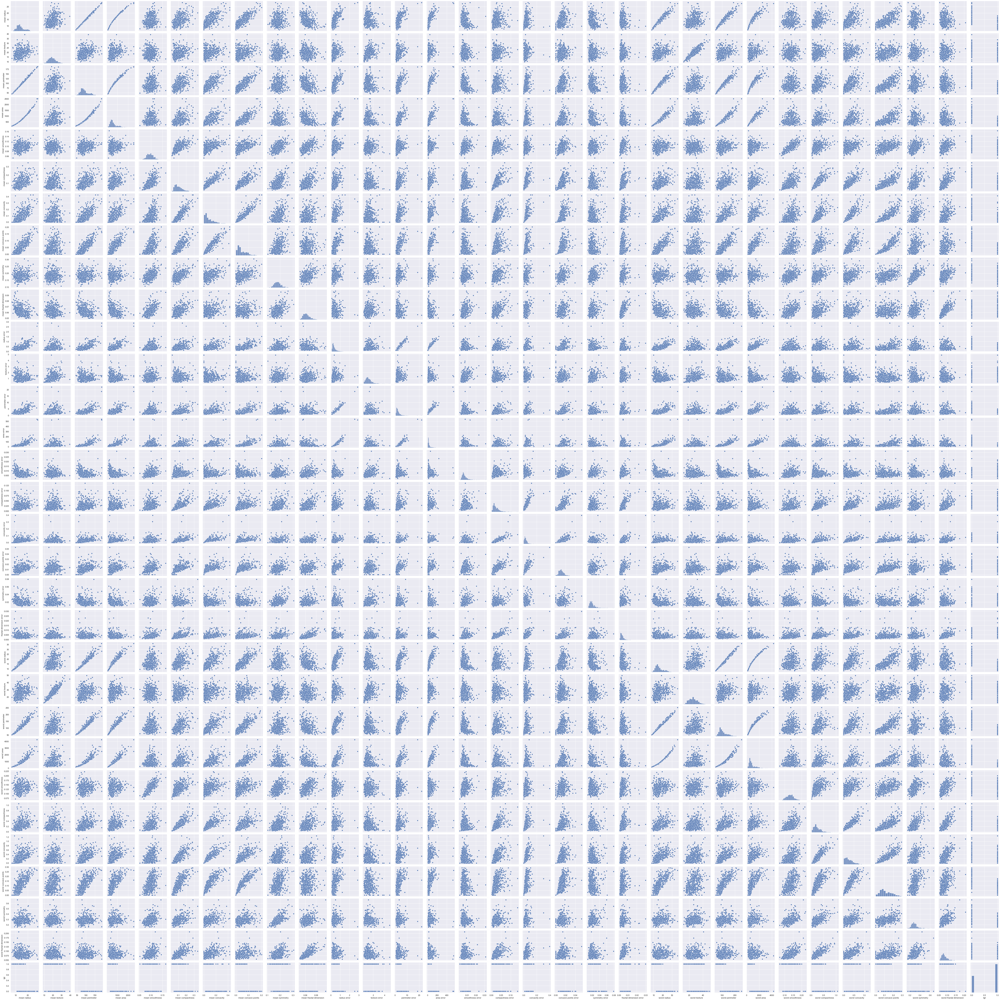

In [12]:
sns.pairplot(df3)

# Preparing the model fitting by train-test-split

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
X = df
y = df1

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, np.ravel(y), test_size=0.33, random_state=36)

# Pilot Test - Fittting the model with unscaled data

In [16]:
from sklearn.linear_model import LogisticRegression

In [17]:
log = LogisticRegression(max_iter=1000)

In [18]:
log.fit(X_train,y_train)

LogisticRegression(max_iter=1000)

# Prediction and Evaluation

In [19]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

In [20]:
y_pred_train = log.predict(X_train)

print(classification_report(y_train,y_pred_train))
print('')
print(confusion_matrix(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.96      0.95      0.95       148
           1       0.97      0.97      0.97       233

    accuracy                           0.96       381
   macro avg       0.96      0.96      0.96       381
weighted avg       0.96      0.96      0.96       381


[[140   8]
 [  6 227]]


In [21]:
y_pred = log.predict(X_test)

print(classification_report(y_test,y_pred))
print('')
print(confusion_matrix(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.95      0.84      0.89        64
           1       0.92      0.98      0.95       124

    accuracy                           0.93       188
   macro avg       0.94      0.91      0.92       188
weighted avg       0.93      0.93      0.93       188


[[ 54  10]
 [  3 121]]


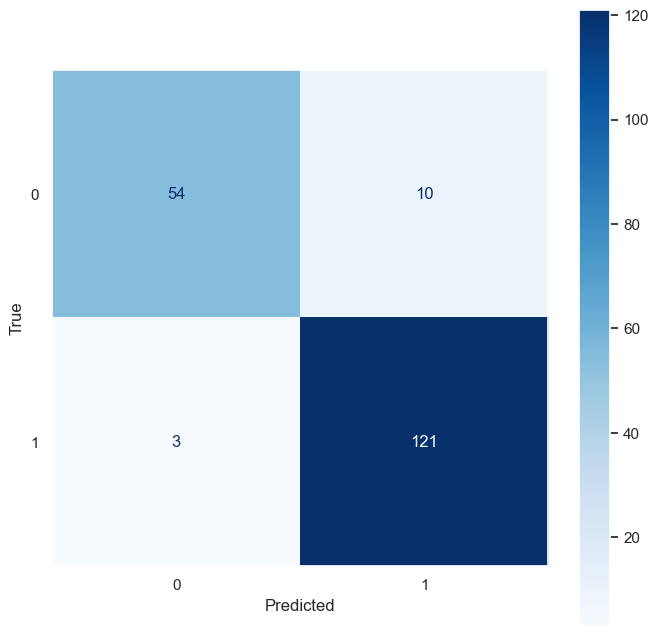

In [22]:
cm = confusion_matrix(y_test,y_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=['0','1'])
fig, ax = plt.subplots(figsize=(8,8))
cmd.plot(include_values=True, cmap='Blues', ax=ax)
cmd.ax_.set(xlabel='Predicted', ylabel='True', autoscale_on=True)
plt.grid(visible=None)

# Scaling Data for Additional Modeling

In [23]:
from sklearn.preprocessing import StandardScaler

In [24]:
scaler = StandardScaler()

In [25]:
scaler.fit(X_train)

StandardScaler()

In [26]:
X_train_scaled = scaler.transform(X_train)

In [27]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_train_scaled.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
107,-0.526151,-0.247580,-0.557997,-0.556546,-0.796130,-0.694844,-0.812637,-0.799789,-0.727769,-0.277335,...,-0.644233,0.216169,-0.671231,-0.609647,-0.603439,-0.378250,-0.401585,-0.490979,0.141809,-0.646828
271,-0.828615,-1.494165,-0.836856,-0.777369,0.161557,-0.541788,-0.732718,-0.577713,-0.126247,-0.002223,...,-0.841318,-1.612805,-0.884834,-0.756153,0.137199,-0.663079,-0.716113,-0.443300,-0.254672,-0.207566
132,0.548020,0.432376,0.560319,0.406156,0.335168,0.468035,0.187900,0.183311,1.282107,-0.513337,...,0.611422,0.893746,0.622105,0.457679,0.294691,0.303840,0.099665,0.233187,0.930014,-0.419062
489,0.697839,0.128662,0.597336,0.540278,-1.487753,-0.637520,-0.683378,-0.697005,0.151101,-1.276637,...,0.552500,0.065776,0.551783,0.303729,-1.348334,0.219516,-0.145021,-0.445313,2.828365,-0.416963
68,-1.467746,-0.521829,-1.389639,-1.163180,0.744496,0.717017,2.869446,-0.146342,1.105613,2.392867,...,-1.249710,-0.566522,-1.259005,-0.980817,0.665011,1.122099,4.626594,0.911221,2.116285,1.748911


In [28]:
log_scaled = LogisticRegression(max_iter=10000)

In [29]:
log_scaled.fit(X_train_scaled,y_train)

LogisticRegression(max_iter=10000)

In [30]:
X_test_scaled = scaler.transform(X_test)

In [31]:
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)
X_test_scaled.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
63,-1.427041,-1.308311,-1.372776,-1.133998,-1.329667,-0.321179,-0.382845,-0.730823,1.934056,0.932348,...,-1.310664,-1.119580,-1.256368,-1.005517,-1.456451,-0.556268,-0.658149,-1.010342,0.616001,0.038044
525,-1.597212,-1.480566,-1.564851,-1.245112,0.532775,-0.537156,-0.822659,-0.909229,-0.454023,1.152167,...,-1.419772,-1.245716,-1.323467,-1.063882,1.341801,-0.208352,-0.488532,-0.480143,0.141809,1.087656
500,0.231422,-0.655553,0.253080,0.068327,0.196138,0.622442,-0.160175,0.324172,-0.490042,0.805580,...,0.060803,-0.925524,0.036089,-0.080467,-0.812010,-0.245205,-0.440069,-0.221933,-1.136446,0.069007
292,-0.359372,-0.818743,-0.388131,-0.424669,0.313996,-0.477130,-0.361387,-0.413951,-0.266722,0.267494,...,-0.552802,-1.006381,-0.576004,-0.539778,0.669267,-0.312664,-0.257149,-0.163108,0.771421,0.612181
46,-1.703216,-0.632888,-1.680837,-1.299546,-0.709324,-0.863148,-0.948192,-1.153753,-0.126247,0.311998,...,-1.523191,-0.678104,-1.500443,-1.120387,-0.122450,-0.756773,-0.995008,-1.400908,0.335292,-0.529272


# Predictions and Evaluations of scaled data

In [32]:
y_pred_scaled_train = log_scaled.predict(X_train_scaled)

print(classification_report(y_train,y_pred_scaled_train))
print('')
print(confusion_matrix(y_train,y_pred_scaled_train))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       148
           1       0.99      1.00      0.99       233

    accuracy                           0.99       381
   macro avg       0.99      0.99      0.99       381
weighted avg       0.99      0.99      0.99       381


[[145   3]
 [  1 232]]


In [33]:
y_pred_scaled = log_scaled.predict(X_test_scaled)

print(classification_report(y_test,y_pred_scaled))
print('')
print(confusion_matrix(y_test,y_pred_scaled))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        64
           1       0.98      0.99      0.98       124

    accuracy                           0.98       188
   macro avg       0.98      0.97      0.98       188
weighted avg       0.98      0.98      0.98       188


[[ 61   3]
 [  1 123]]


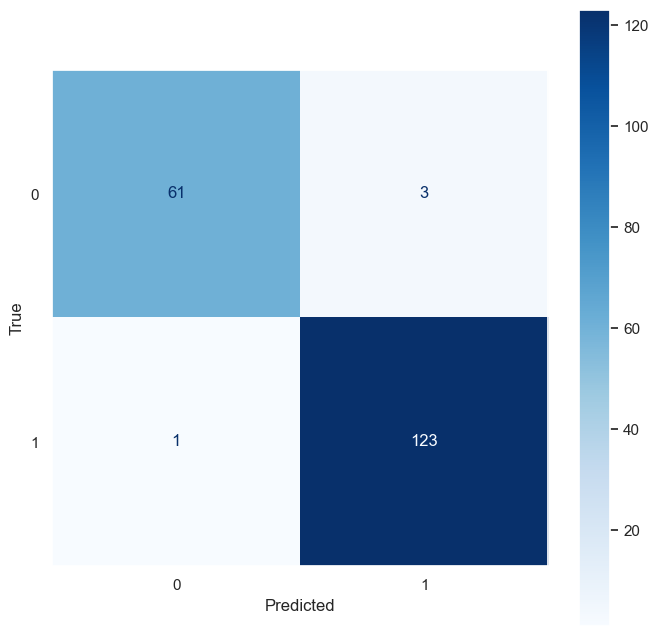

In [34]:
cm = confusion_matrix(y_test,y_pred_scaled)
cmd = ConfusionMatrixDisplay(cm, display_labels=['0','1'])
fig, ax = plt.subplots(figsize=(8,8))
cmd.plot(include_values=True, cmap='Blues', ax=ax)
cmd.ax_.set(xlabel='Predicted', ylabel='True', autoscale_on=True)
plt.grid(visible=None)

# Testing and Evaluating other models

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

### For loop to iterate through various models
### Logistic Regression is a clear winner

Training Fit: LogisticRegression(max_iter=1000)
[[145   3]
 [  1 232]]

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       148
           1       0.99      1.00      0.99       233

    accuracy                           0.99       381
   macro avg       0.99      0.99      0.99       381
weighted avg       0.99      0.99      0.99       381

Testing Fit: LogisticRegression(max_iter=1000)
[[ 61   3]
 [  1 123]]

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        64
           1       0.98      0.99      0.98       124

    accuracy                           0.98       188
   macro avg       0.98      0.97      0.98       188
weighted avg       0.98      0.98      0.98       188

LogisticRegression(max_iter=1000)


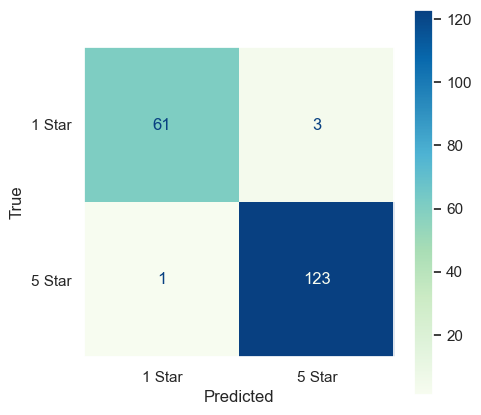

_________________________________________________________


Training Fit: RandomForestClassifier(n_estimators=200)
[[148   0]
 [  0 233]]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       148
           1       1.00      1.00      1.00       233

    accuracy                           1.00       381
   macro avg       1.00      1.00      1.00       381
weighted avg       1.00      1.00      1.00       381

Testing Fit: RandomForestClassifier(n_estimators=200)
[[ 60   4]
 [  2 122]]

              precision    recall  f1-score   support

           0       0.97      0.94      0.95        64
           1       0.97      0.98      0.98       124

    accuracy                           0.97       188
   macro avg       0.97      0.96      0.96       188
weighted avg       0.97      0.97      0.97       188

RandomForestClassifier(n_estimators=200)


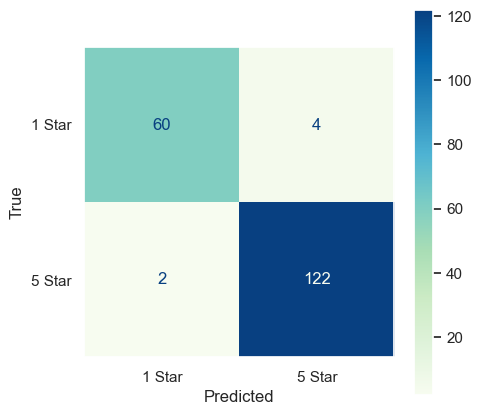

_________________________________________________________


Training Fit: SVC(C=0.1, gamma=10000, kernel='linear')
[[144   4]
 [  1 232]]

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       148
           1       0.98      1.00      0.99       233

    accuracy                           0.99       381
   macro avg       0.99      0.98      0.99       381
weighted avg       0.99      0.99      0.99       381

Testing Fit: SVC(C=0.1, gamma=10000, kernel='linear')
[[ 61   3]
 [  1 123]]

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        64
           1       0.98      0.99      0.98       124

    accuracy                           0.98       188
   macro avg       0.98      0.97      0.98       188
weighted avg       0.98      0.98      0.98       188

SVC(C=0.1, gamma=10000, kernel='linear')


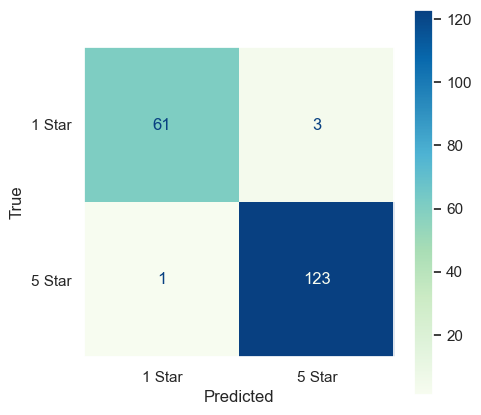

_________________________________________________________


Training Fit: GradientBoostingClassifier(random_state=36)
[[148   0]
 [  0 233]]

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       148
           1       1.00      1.00      1.00       233

    accuracy                           1.00       381
   macro avg       1.00      1.00      1.00       381
weighted avg       1.00      1.00      1.00       381

Testing Fit: GradientBoostingClassifier(random_state=36)
[[ 61   3]
 [  3 121]]

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        64
           1       0.98      0.98      0.98       124

    accuracy                           0.97       188
   macro avg       0.96      0.96      0.96       188
weighted avg       0.97      0.97      0.97       188

GradientBoostingClassifier(random_state=36)


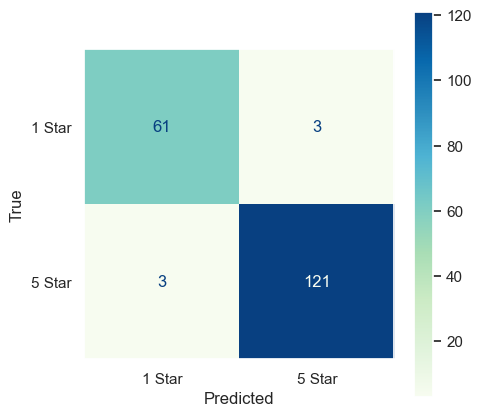

_________________________________________________________




In [37]:
list1 = [LogisticRegression(max_iter=1000), RandomForestClassifier(n_estimators=200),
         SVC(C=0.1, gamma=10000, kernel='linear'), GradientBoostingClassifier(random_state=36)]

for i in list1:
    model = i


    model.fit(X_train_scaled,y_train)
    
    y_pred_train = model.predict(X_train_scaled)
    print('Training Fit:',i)
    print(confusion_matrix(y_train,y_pred_train))
    print('')
    print(classification_report(y_train,y_pred_train))

    y_pred = model.predict(X_test_scaled)
    print('Testing Fit:',i)
    print(confusion_matrix(y_test,y_pred))
    print('')
    print(classification_report(y_test,y_pred))

    cm = confusion_matrix(y_test,y_pred)
    cmd = ConfusionMatrixDisplay(cm, display_labels=['1 Star','5 Star'])
    fig, ax = plt.subplots(figsize=(5,5))
    cmd.plot(include_values=True, cmap='GnBu', ax=ax)
    cmd.ax_.set(xlabel='Predicted', ylabel='True', autoscale_on=True)
    plt.grid(visible=None)
    print(i)
    plt.show()
    print('_________________________________________________________')
    print('\n')





# Hyper Tuning SVC

In [38]:
from sklearn.model_selection import GridSearchCV

In [39]:
param = {'C':[0.001, 0.01, 0.1],'gamma':[10000,1000,100,10, 1, 0.1], 'kernel':['linear','rbf']}

grid = GridSearchCV(SVC(), param, cv=15)

In [40]:
grid.fit(X_train_scaled,y_train)

GridSearchCV(cv=15, estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1],
                         'gamma': [10000, 1000, 100, 10, 1, 0.1],
                         'kernel': ['linear', 'rbf']})

In [41]:
grid.best_estimator_

SVC(C=0.1, gamma=10000, kernel='linear')

In [42]:
y_pred_train = grid.predict(X_train_scaled)

print(classification_report(y_train,y_pred_scaled_train))
print('')
print(confusion_matrix(y_train,y_pred_scaled_train))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       148
           1       0.99      1.00      0.99       233

    accuracy                           0.99       381
   macro avg       0.99      0.99      0.99       381
weighted avg       0.99      0.99      0.99       381


[[145   3]
 [  1 232]]


In [43]:
y_pred_scaled = grid.predict(X_test_scaled)

print(classification_report(y_test,y_pred_scaled))
print('')
print(confusion_matrix(y_test,y_pred_scaled))

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        64
           1       0.98      0.99      0.98       124

    accuracy                           0.98       188
   macro avg       0.98      0.97      0.98       188
weighted avg       0.98      0.98      0.98       188


[[ 61   3]
 [  1 123]]
